# Getting Started with `feems`

This notebook illustrates a minimal example of how to run `feems` on a dataset of North American gray wolves published in [Schweizer et al. 2015](https://onlinelibrary.wiley.com/doi/full/10.1111/mec.13364?casa_token=idW0quVPOU0AAAAA%3Ao_ll85b8rDbnW3GtgVeeBUB4oDepm9hQW3Y445HI84LC5itXsiH9dGO-QYGPMsuz0b_7eNkRp8Mf6tlW). 

*Note: This notebook has been changed slightly from the original to account for long range migration in an empirical data set i.e., one of the wolves population in a blue corridor is moved far away from its current location to test the ability of the model to recapitulate this long range edge.*

## Imports

First we import the required packages and `feems`:

In [90]:
# base
import numpy as np
import pkg_resources
from sklearn.impute import SimpleImputer
from pandas_plink import read_plink
from copy import deepcopy

# viz
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# feems
from feems.utils import prepare_graph_inputs
from feems.spatial_graph import query_node_attributes
from feems import SpatialGraph, Viz, Objective
from feems.cross_validation import comp_mats
from feems.helper_funcs import cov_to_dist, comp_genetic_vs_fitted_distance

# for debugging
#import importlib
%load_ext autoreload

# change matplotlib fonts
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.sans-serif"] = "Arial"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Data

Note we have packaged this example dataset in the `feems` package and use the `pkg_resources` package to find the path of those files:

In [36]:
data_path = pkg_resources.resource_filename("feems", "data/")

Next we read the `plink` formatted genotype data and impute any missing SNPs with the mean at each SNP:

In [37]:
# read the genotype data and mean impute missing data
(bim, fam, G) = read_plink("{}/wolvesadmix".format(data_path))
imp = SimpleImputer(missing_values=np.nan, strategy="mean")
genotypes = imp.fit_transform((np.array(G)).T)

print("n_samples={}, n_snps={}".format(genotypes.shape[0], genotypes.shape[1]))

Mapping files: 100%|██████████| 3/3 [00:00<00:00, 25.63it/s]
n_samples=111, n_snps=17729


As we can see we have 111 samples and 17,729 SNPs. For preparing the graph inputs to run `feems` you have two options:

* Prepare your own input files
* Use the `feems` function `prepare_graph_inputs` which intersects a discrete global grid (DGG) with the sample range

We'll show off the later option. We read the sample coordinates, coordinates of the outer polygon that defines the habitat of the sample and a discrete global grid file which has laid down a triangular grid that is uniformly spaced on earth. We then intersect this global grid with the outer file to define the graph that we use to optimize:

In [38]:
%%time
# setup graph
coord = np.loadtxt("{}/wolvesadmix_longrange.coord".format(data_path), skiprows=1)  # sample coordinates
outer = np.loadtxt("{}/wolvesadmix.outer".format(data_path))  # outer coordinates
grid_path = "{}/grid_100.shp".format(data_path)  # path to discrete global grid

# graph input files
outer, edges, grid, _ = prepare_graph_inputs(coord=coord, 
                                             ggrid=grid_path,
                                             translated=True, 
                                             buffer=0,
                                             outer=outer)

CPU times: user 5.87 s, sys: 373 ms, total: 6.24 s
Wall time: 6.67 s


Lets take a peek at each of these inputs:

In [39]:
coord[90:95, ]

array([[-137.333   ,   68.817   ],
       [-110.71041 ,   45.352692],
       [-140.52    ,   65.12    ],
       [-139.75    ,   60.83    ],
       [-134.833   ,   67.667   ]])

In [6]:
edges[:5, ]

array([[838, 839],
       [357, 386],
       [605, 637],
       [536, 537],
       [136, 158]])

In [40]:
grid[:5, ]

array([[-166.637,   59.732],
       [-166.585,   60.675],
       [-166.529,   61.623],
       [-168.75 ,   62.088],
       [-166.467,   62.576]])

## Setup the `SpatialGraph` object

We then setup the `SpatialGraph` object which is the core workhorse of `feems`. `SpatialGraph` specifies the graph, allele frequency data, and runs the optimizers to fit the edge weights of the graph:

In [41]:
%%time
sp_graph = SpatialGraph(genotypes, coord, grid, edges)

CPU times: user 2min 13s, sys: 3.1 s, total: 2min 16s
Wall time: 2min 18s


This might take a few minutes to construct at first b/c it initializing a number of graph matrices that are slow to build. First, before any fitting we'll visualize the graph and samples. Lets setup the projection we'll be using for this dataset:

In [42]:
projection = ccrs.EquidistantConic(central_longitude=-108.842926, central_latitude=66.037547)

Now lets make a map of the sample coordinates, graph and observed nodes:

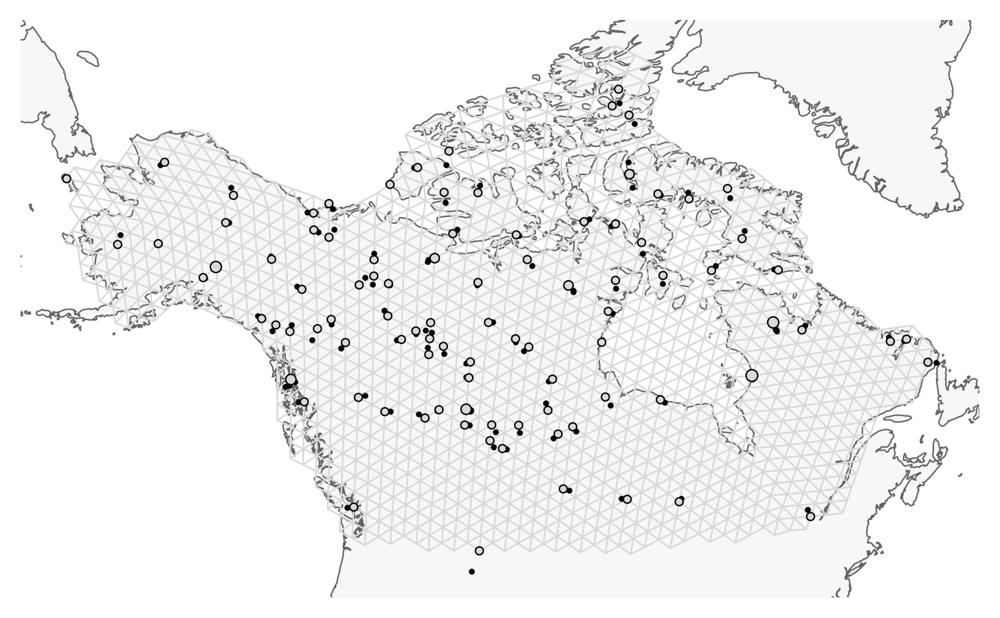

In [43]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, sp_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_samples()
v.draw_edges(use_weights=False)
v.draw_obs_nodes(use_ids=False)

The black points are the observed locations for each sample and the gray points show the nodes that samples were assigned to. The gray lines represent the graph that will be fitted.

## Fit `feems`

First we fit the null model with a single edge-weight parameter $w_0$ and residual variance parameter $s^2$:

In [19]:
%%time
sp_graph.fit_null_model()

constant-w/variance fit, converged in 132 iterations, train_loss=2795677.6520805
CPU times: user 2.87 s, sys: 66.3 ms, total: 2.94 s
Wall time: 885 ms


Next we fit a more flexible model where we allow a weight to be estimated for every edge, which is encoded in a large adjacency matrix $\mathbf{W}$, while enforcing nearby edges to be smooth. We initialize at the fit from the null model and fix the estimate of the residual variance for the more complex optimization:

In [44]:
%%time
sp_graph.fit(lamb = 20.0)

constant-w/variance fit, converged in 122 iterations, train_loss=2796782.2571608
lambda=20.0000000, alpha=0.8302267, converged in 58 iterations, train_loss=2784500.2416858
CPU times: user 4.24 s, sys: 981 ms, total: 5.22 s
Wall time: 2.29 s


Now we can visualize the weighted graph:

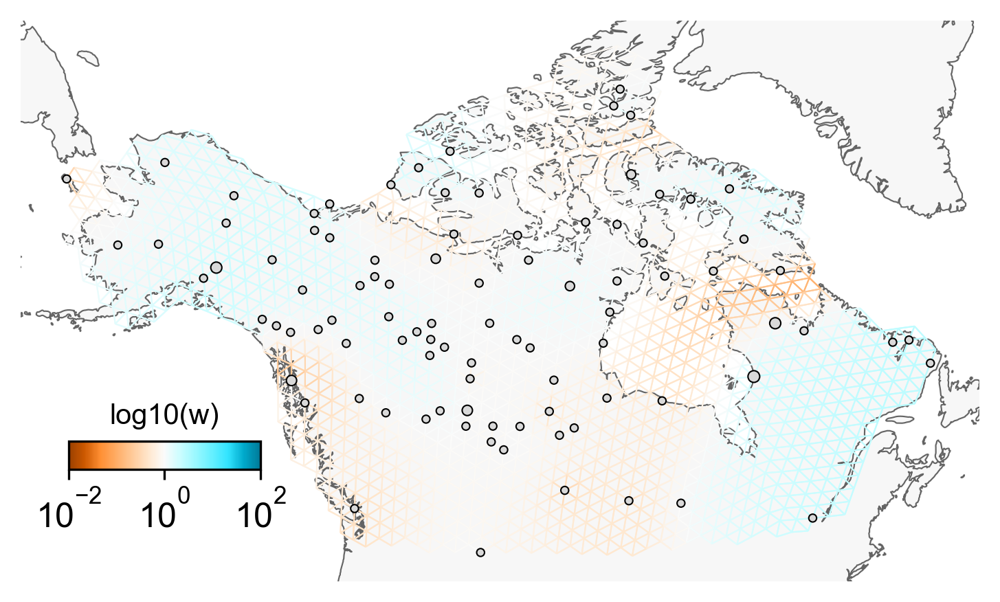

In [24]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, sp_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_edges(use_weights=True)
v.draw_obs_nodes(use_ids=False) 
v.draw_edge_colorbar()

Lets now try a different regularization setting that isn't as smooth:

In [45]:
%%time
sp_graph.fit(lamb = 2.0)

constant-w/variance fit, converged in 122 iterations, train_loss=2796782.2571608
lambda=2.0000000, alpha=0.8302267, converged in 72 iterations, train_loss=2767765.0087286
CPU times: user 4.59 s, sys: 425 ms, total: 5.02 s
Wall time: 2.38 s


Make the viz:

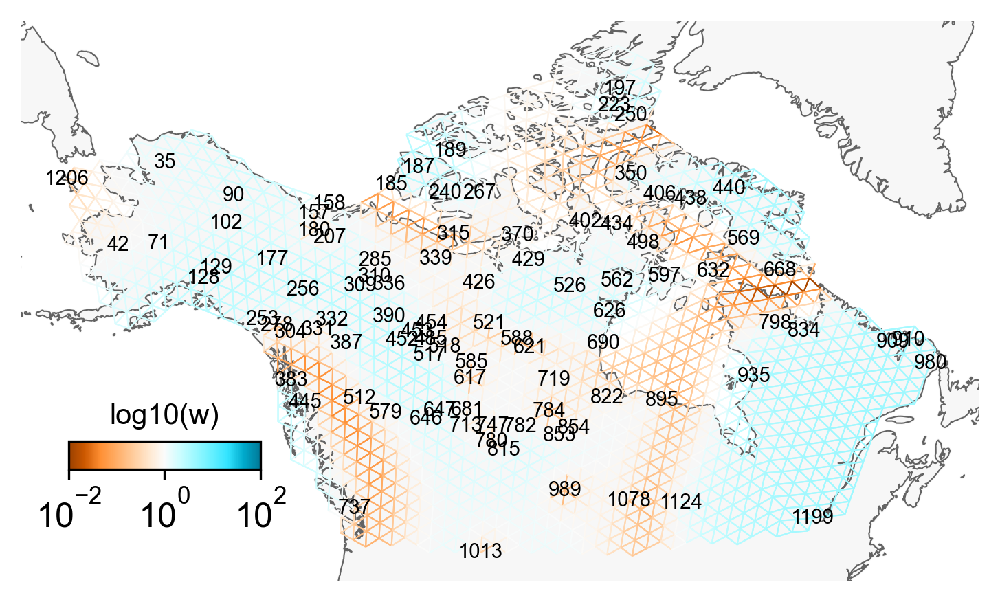

In [51]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, sp_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_edges(use_weights=True)
v.draw_obs_nodes(use_ids=True) 
v.draw_edge_colorbar()

June 28, 2021:  
* Moving a population from Newfoundland to Quebec (southernmost population in the eastern corridor) does not change the results whatsoever. `feems` still detects the corridors with high migrations, since the signal is pretty strong in these areas.  
* Moving a barrier population from off the coast of British Columbia to Alberta (again southermost population in the left central corridor) does change the result a bit. It reduces effective migration in a previous corridor and adjoining edges to this newly placed population show very low migration rates. Results below for difference in fits between the two (very high correlation: 0.98). 

In [29]:
coord_def = np.loadtxt("{}/wolvesadmix.coord".format(data_path))  # sample coordinates

# graph input files
outer_def, edges_def, grid_def, _ = prepare_graph_inputs(coord=coord_def, 
                                                        ggrid=grid_path,
                                                        translated=True, 
                                                        buffer=0,
                                                        outer=outer)

sp_graph_def = SpatialGraph(genotypes, coord_def, grid_def, edges_def)
sp_graph_def.fit(lamb=2.0)
np.corrcoef(sp_graph_def.w, sp_graph.w)[0,1]

NameError: name 'plot_default_vs_long_range' is not defined

## Running residual analysis on the wolves data

constant-w/variance fit, converged in 122 iterations, train_loss=2796782.2571608
lambda=2.0000000, alpha=0.8302267, converged in 86 iterations, train_loss=2767764.9350050


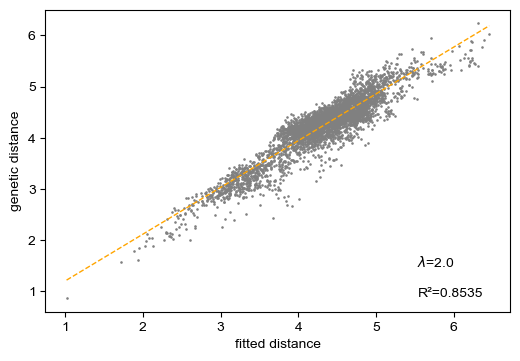

In [46]:
# there are no distinct outliers, but will see which nodes get returned as having the highest residuals
comp_genetic_vs_fitted_distance(sp_graph, lamb=2.0, plotFig=True)

In [81]:
max_res_nodes = comp_genetic_vs_fitted_distance(sp_graph, lamb=2.0, plotFig=False, n_lre=10)

constant-w/variance fit, converged in 122 iterations, train_loss=2796782.2571608
lambda=2.0000000, alpha=0.8302267, converged in 86 iterations, train_loss=2767764.9350050


In [87]:
# looks like nodes around 11, 17, 42, 56, 67 are in the mix (ignoring nodes that are within the same 'population' group)
max_res_nodes

[(16, 18),
 (43, 67),
 (42, 67),
 (11, 13),
 (42, 56),
 (13, 16),
 (18, 37),
 (13, 18),
 (56, 67),
 (11, 17)]

In [54]:
# only look for nodes that are representative of sampled populations...
permuted_idx = query_node_attributes(sp_graph, "permuted_idx")
obs_perm_ids = permuted_idx[: sp_graph.n_observed_nodes]
obs_grid = grid[obs_perm_ids, :]

In [64]:
fit_cov, _, emp_cov = comp_mats(Objective(sp_graph))

In [67]:
np.shape(fit_cov)
np.shape(emp_cov)

(94, 94)

In [88]:
# edges to which nodes must be added (11 through 18 are all same pop...)
print(np.unique(np.ravel(max_res_nodes)))
permuted_idx[np.unique(np.ravel(max_res_nodes))]

[11 13 16 17 18 37 42 43 56 67]


array([185, 189, 223, 240, 250, 402, 438, 440, 569, 668])

In [146]:
# I see two approximate nodes/regions to connect (manual inspection): 439 to 668 (42/43 to 67), 250 to 402 (18 to 37)
# first option is already connected indirectly (part of a strong migration corridor in the northeast)
# edges_lr = deepcopy(edges)
# edges_lr = edges_lr.tolist()
# edges_lr.append([251, 403])
sp_graph_lr = SpatialGraph(genotypes, coord, grid, np.array(edges_lr))

In [147]:
sp_graph_lr.fit(lamb = 2.0)

constant-w/variance fit, converged in 134 iterations, train_loss=2797137.5588875
lambda=2.0000000, alpha=0.8354101, converged in 75 iterations, train_loss=2767813.7831710


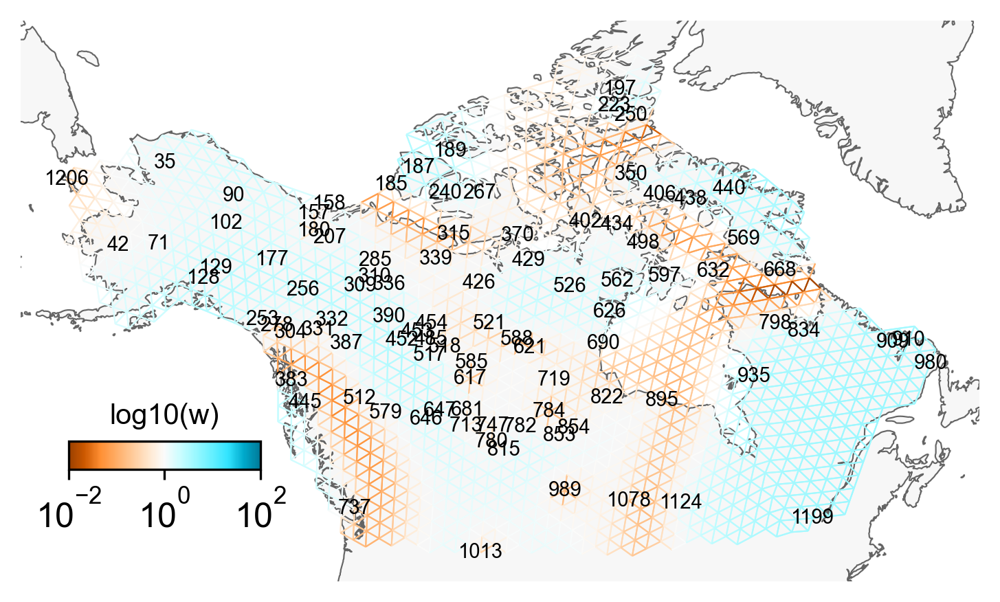

In [149]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, sp_graph_lr, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_edges(use_weights=True)
v.draw_obs_nodes(use_ids=True) 
v.draw_edge_colorbar()